# Bishop's University
## Department of Computer Science
### CS562 - HW4 - W24
#### Your name:

In [59]:
import skimage
from matplotlib import pyplot as plt
import numpy as np
#import h5py

In [60]:
# read original image
i= 690#  737 #103 #690  #1022
imgpath='data_0/Water/Images/im1.png'
#imgpath='data_0/Bio/im.png'
# read image and its ground truth (mask)
im = skimage.io.imread(imgpath)

In [61]:
# size image
im.shape

(311, 323, 4)

In [62]:
# type of data
type(im)

numpy.ndarray

In [63]:
# max and min
print(im.max(), im.min())

255 0


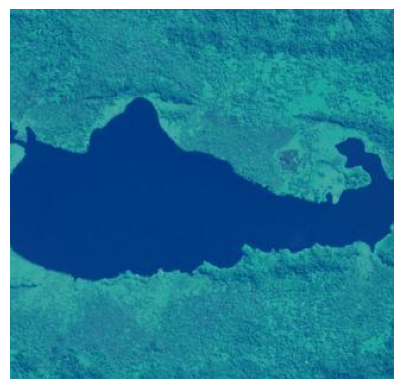

In [64]:
# show image
plt.imshow(im)
plt.axis('off')
plt.show()

In [65]:
# read ground truth (mask)
maskpath='data_0/Water/Masks/im1_gt.png'
# maskpath='data_0/Bio/gt.png'
gt = skimage.io.imread(maskpath)

In [66]:
# type of data
type(gt)

numpy.ndarray

In [67]:
# shape
gt.shape

(311, 323, 3)

In [68]:
# what are the possible of pixel values
np.unique(gt)

array([  0, 255], dtype=uint8)

In [69]:
gt = gt/255 # convert it to 0/1

In [70]:
if len(gt.shape) > 0: # means its 3d image
    gt = gt[:,:,0]    # take firs channel


In [71]:
print(gt.shape, np.unique(gt))

(311, 323) [0. 1.]


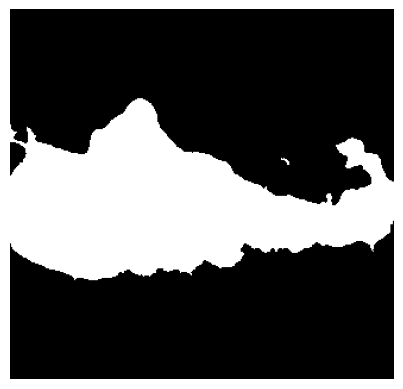

In [72]:
# show image
plt.imshow(gt,cmap='gray')
plt.axis('off')
plt.show()

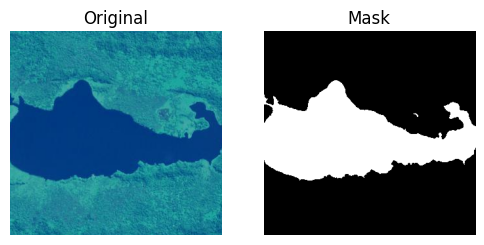

In [73]:
# show original image and its GT
fig = plt.figure(figsize=(6, 6))
fig.add_subplot(1, 2, 1)
plt.imshow(im)
plt.title("Original")
img=['mask']
plt.axis('off')
# GT
fig.add_subplot(1, 2, 2)
plt.imshow(gt, cmap='gray')
plt.title("Mask")
plt.axis('off')
plt.show()

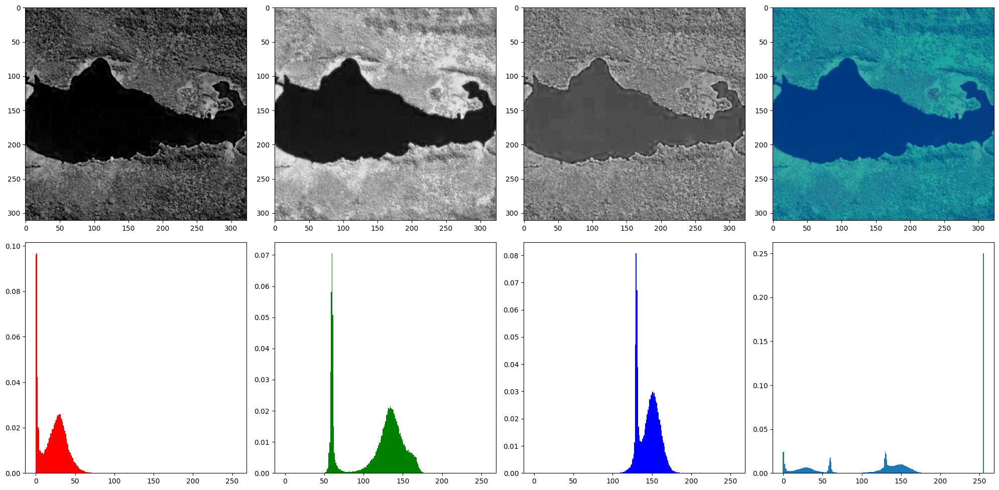

In [74]:
# histograms of channels
def display_hists(im):
    c_red = im[:,:,0]
    c_green = im[:,:,1]
    c_blue = im[:,:,2]
    fig, ax = plt.subplots(2,4)
    fig.set_size_inches(20, 10)

    ax[0,0].imshow(c_red, cmap='gray')
    ax[0,1].imshow(c_green, cmap='gray')
    ax[0,2].imshow(c_blue, cmap='gray')
    ax[0,3].imshow(im)

    bins = np.arange(-0.5, 255+1,1)
    ax[1,0].hist(c_red.flatten(), bins = bins, color='r',density=True)
    ax[1,1].hist(c_green.flatten(), bins=bins, color='g',density=True)
    ax[1,2].hist(c_blue.flatten(), bins=bins, color='b',density=True)
    ax[1,3].hist(im.flatten(), bins=bins, density=True)

    fig.tight_layout() 
    plt.show()

display_hists(im)

## K-means Clustering

In [83]:
# 1. Create Python function called image_segmentation()

import cv2 as cv

# input param1: image
# input param2: center cluster 1, estimated visually from the histogram as explained in the mail text 
# input param3: center cluster 2, estimated visually from the histogram as explained in the mail text 
# output: bin_img. A 0/1 image, 0, foreground (e.g., water body) and 0 background (e.g. land)
def image_segmentation(image, center1, center2):
    # set image to kmeans parameter type
    img = image.reshape((-1, 3))
    img = np.float32(img)

    # kmeans parameters
    criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 10, 1.0)
    K = 2
    attempts = 10
    flags = cv.KMEANS_PP_CENTERS
    center1 = np.zeros((img.shape[0]), dtype=np.float32) + center1
    center2 = np.zeros((img.shape[0]), dtype=np.float32) + center2
    start_labels = np.stack((center1, center2), axis=1)

    # kmeans
    ret, label, centers = cv.kmeans(img, K, start_labels, criteria, attempts, flags)

    # get 0/1 image of resulting kmeans center
    centers = centers.astype(np.uint8)
    result = centers[label.flatten()]
    resImage = result.reshape((image.shape))
    resImage = cv.cvtColor(resImage, cv.COLOR_RGB2BGR)
    black_white = cv.cvtColor(resImage, cv.COLOR_BGR2GRAY)

    return black_white

im = skimage.io.imread(imgpath)
print(im.shape)
imRGB = cv.cvtColor(im, cv.COLOR_BGR2RGB)
img = image_segmentation(imRGB, 35, 140)

(927, 636, 4)
[[ 35. 140.]
 [ 35. 140.]
 [ 35. 140.]
 ...
 [ 35. 140.]
 [ 35. 140.]
 [ 35. 140.]]


In [84]:
def displayImages(original, result):
    figure_size = 10
    plt.figure(figsize=(figure_size,figure_size))
    
    plt.subplot(1,2,1),
    plt.imshow(original)
    plt.xticks([]), 
    plt.yticks([])

    plt.subplot(1,2,2),
    plt.imshow(result, cmap='gray')
    plt.xticks([]), 
    plt.yticks([])
    plt.show()

In [85]:
def readImages(imgpath, gtpath):
    im1 = skimage.io.imread(imgpath)
    gt1 = skimage.io.imread(gtpath)
    gt1 = cv.cvtColor(gt1, cv.COLOR_BGR2GRAY)
    gt1 = gt1/gt1.max()
    return im1, gt1

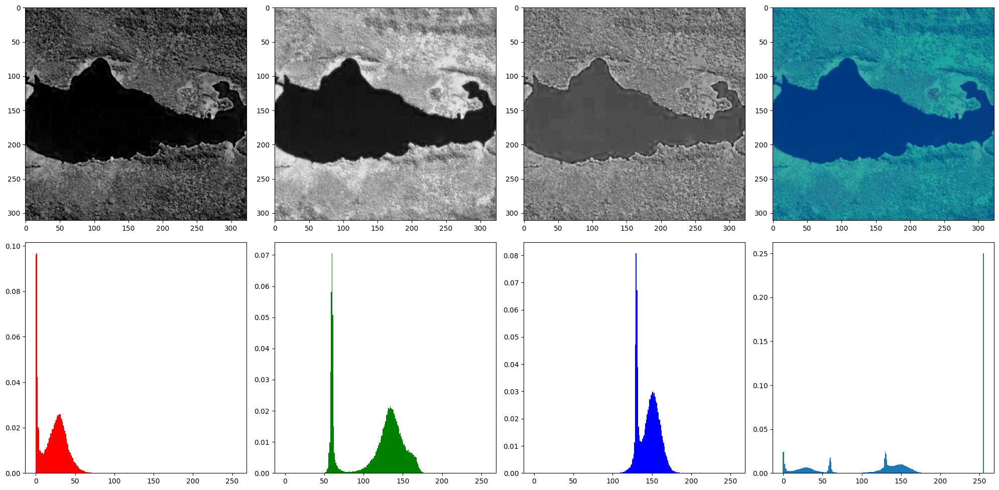

[[ 0. 33.]
 [ 0. 33.]
 [ 0. 33.]
 ...
 [ 0. 33.]
 [ 0. 33.]
 [ 0. 33.]]


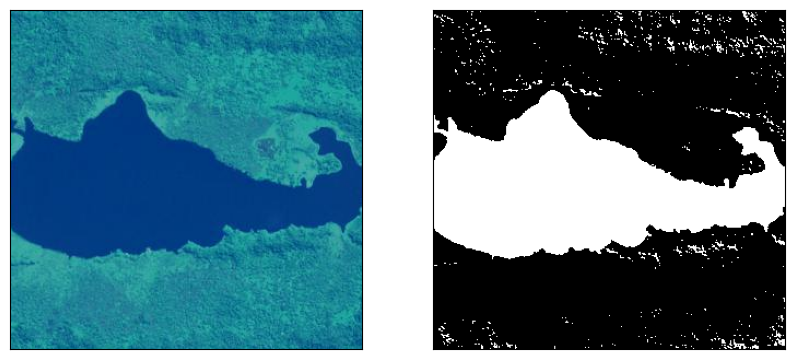

In [86]:
# 2. Apply kmeans on the color image im1, and show the output
def applyKmeans(image):
    im1_seg = image_segmentation(image, 0, 33)

    middle = (im1_seg.max() + im1_seg.min())/2
    ret, im1_seg = cv.threshold(im1_seg, middle, 1, cv.THRESH_BINARY_INV)

    return im1_seg

imgpath = 'data_0/Water/Images/im1.png'
gtpath = 'data_0/Water/Masks/im1_gt.png'
im, gt = readImages(imgpath, gtpath)
display_hists(im)
imRBG = cv.cvtColor(im, cv.COLOR_BGR2RGB)
im_seg = applyKmeans(imRBG)
displayImages(im, im_seg)

In [87]:
# 3. Compute the confusion matrix, Recall, Precision and F-scoe (use classification report on Sklearn)

from sklearn.metrics import classification_report

def getCalcs(im_seg, gt):
    gt1_flat = gt.flatten()
    im1_seg_flat = im_seg.flatten()

    print(classification_report(y_true=gt1_flat, y_pred=im1_seg_flat))

getCalcs(im_seg, gt)


              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98     72634
         1.0       0.92      1.00      0.96     27819

    accuracy                           0.97    100453
   macro avg       0.96      0.98      0.97    100453
weighted avg       0.98      0.97      0.97    100453



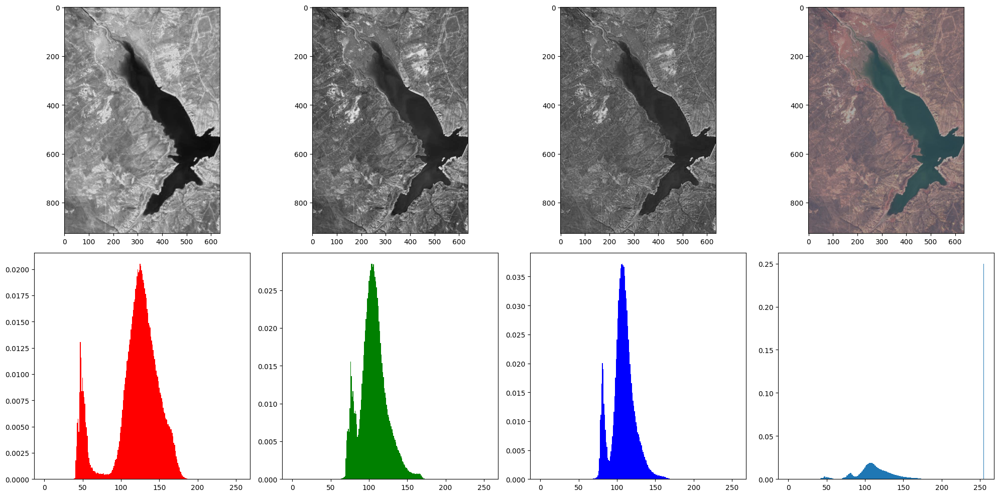

[[ 0. 33.]
 [ 0. 33.]
 [ 0. 33.]
 ...
 [ 0. 33.]
 [ 0. 33.]
 [ 0. 33.]]


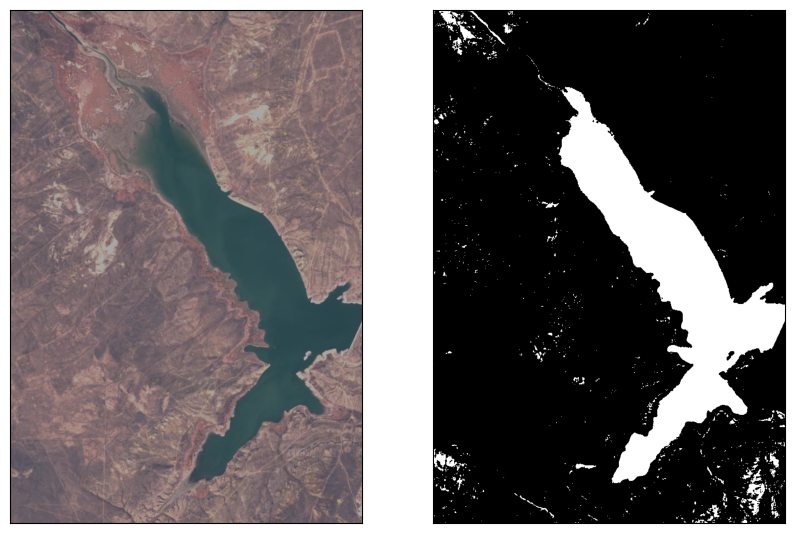

In [88]:
# 4. Apply kmeans on the color image im2, and show the output
imgpath = 'data_0/Water/Images/im2.png'
gtpath = 'data_0/Water/Masks/im2_gt.png'
im, gt = readImages(imgpath, gtpath)
display_hists(im)
imRBG = cv.cvtColor(im, cv.COLOR_BGR2RGB)
im_seg = applyKmeans(imRBG)
displayImages(im, im_seg)

In [89]:
# 5. Compute the confusion matrix, Recall, Precision and F-scoe (use classification report on Sklearn)
getCalcs(im_seg, gt)

              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99    510901
         1.0       0.88      0.99      0.93     78671

    accuracy                           0.98    589572
   macro avg       0.94      0.98      0.96    589572
weighted avg       0.98      0.98      0.98    589572



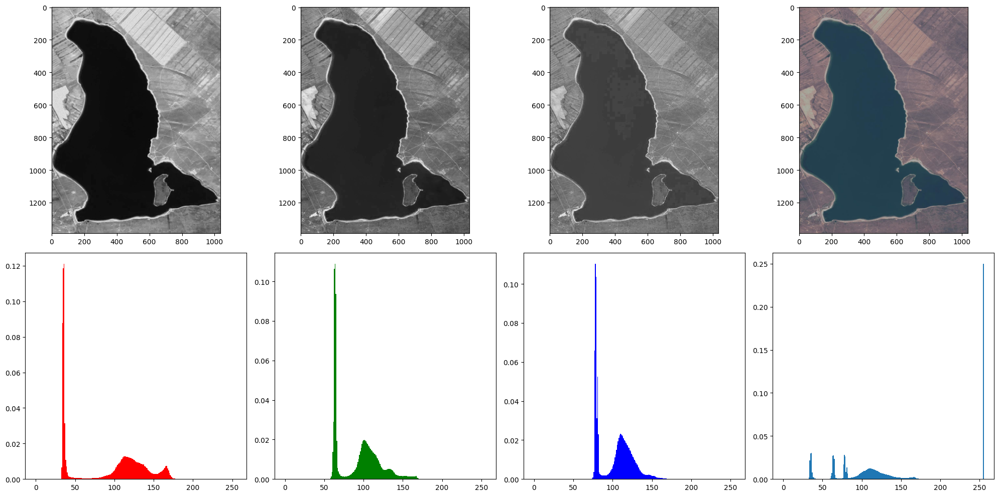

[[ 0. 33.]
 [ 0. 33.]
 [ 0. 33.]
 ...
 [ 0. 33.]
 [ 0. 33.]
 [ 0. 33.]]


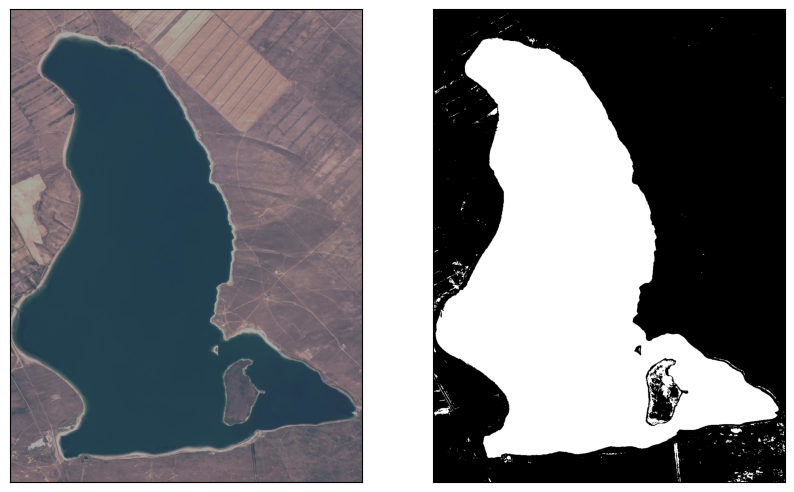

In [90]:
# 6. Apply kmeans on the color image im3, and show the output
imgpath = 'data_0/Water/Images/im3.png'
gtpath = 'data_0/Water/Masks/im3_gt.png'
im, gt = readImages(imgpath, gtpath)
display_hists(im)
imRBG = cv.cvtColor(im, cv.COLOR_BGR2RGB)
im_seg = applyKmeans(imRBG)
displayImages(im, im_seg)

In [91]:
# 7. Compute the confusion matrix, Recall, Precision and F-scoe (use classification report on Sklearn)
getCalcs(im_seg, gt)

              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99    851537
         1.0       0.97      1.00      0.99    588503

    accuracy                           0.99   1440040
   macro avg       0.99      0.99      0.99   1440040
weighted avg       0.99      0.99      0.99   1440040



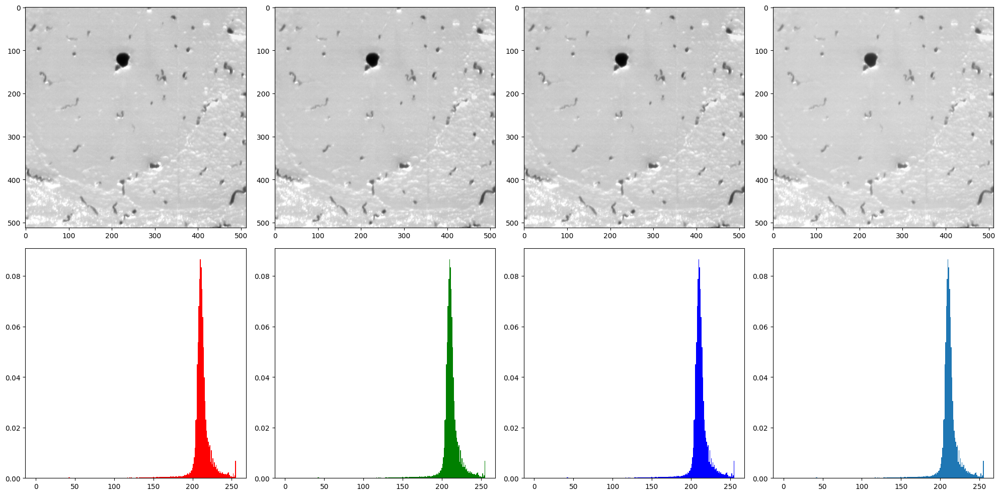

[[ 0. 33.]
 [ 0. 33.]
 [ 0. 33.]
 ...
 [ 0. 33.]
 [ 0. 33.]
 [ 0. 33.]]


/tmp/ipykernel_7798/430315772.py:5: RuntimeWarning: overflow encountered in scalar add
  middle = (im1_seg.max() + im1_seg.min())/2


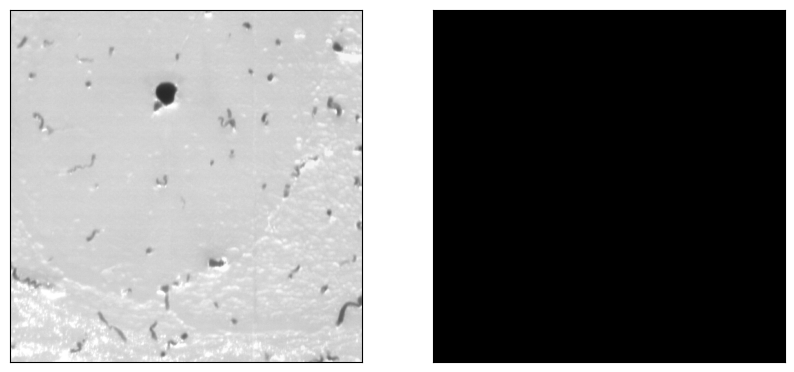

In [92]:
# 7. Apply kmeans on the color image im4, and show the output
imgpath = 'data_0/Bio/im4.png'
gtpath = 'data_0/Bio/im4_gt.png'
im, gt = readImages(imgpath, gtpath)
display_hists(im)
imRBG = cv.cvtColor(im, cv.COLOR_BGR2RGB)
im_seg = applyKmeans(imRBG)
displayImages(im, im_seg)

In [93]:
# 8. Compute the confusion matrix, Recall, Precision and F-scoe (use classification report on Sklearn)
getCalcs(im_seg, gt)

/home/agathe/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/agathe/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         0.0       0.97      1.00      0.99    254686
         1.0       0.00      0.00      0.00      7458

    accuracy                           0.97    262144
   macro avg       0.49      0.50      0.49    262144
weighted avg       0.94      0.97      0.96    262144



/home/agathe/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Channel selection 

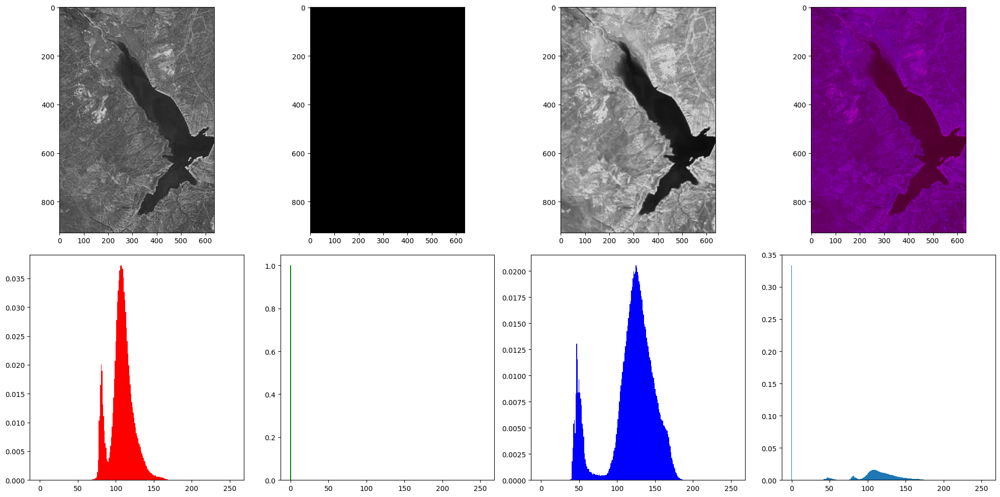

[[ 0. 33.]
 [ 0. 33.]
 [ 0. 33.]
 ...
 [ 0. 33.]
 [ 0. 33.]
 [ 0. 33.]]


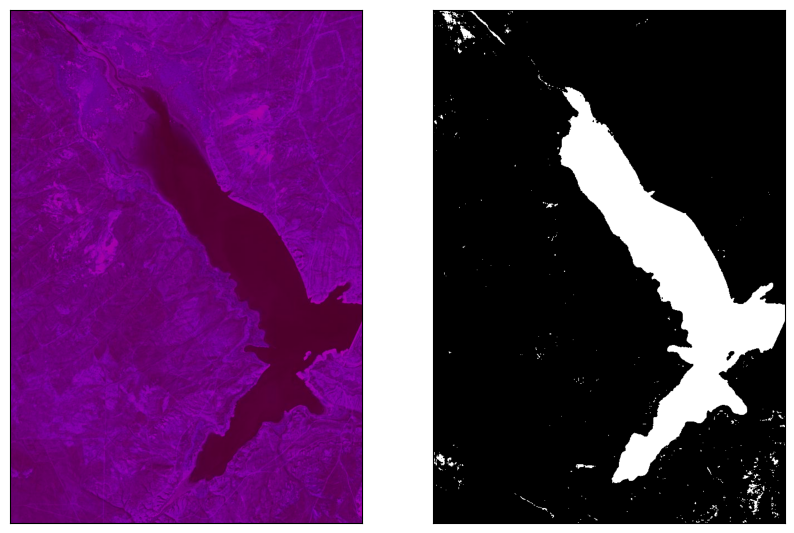

              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99    510901
         1.0       0.94      0.99      0.96     78671

    accuracy                           0.99    589572
   macro avg       0.97      0.99      0.98    589572
weighted avg       0.99      0.99      0.99    589572



In [94]:
# Use im2 to conduct the following experiment
# 9. Select Red and Blue channels,  apply clustring then provide classification report.

imgpath = 'data_0/Water/Images/im2.png'
gtpath = 'data_0/Water/Masks/im2_gt.png'

im2, gt2 = readImages(imgpath, gtpath)

im2 = cv.cvtColor(im2, cv.COLOR_BGR2RGB)
(b,g,r) = cv.split(im2)

black = np.zeros((b.shape), dtype=np.uint8)

image_br = cv.merge([b, black, r])
display_hists(image_br)

im2_seg = applyKmeans(image_br)

displayImages(image_br, im2_seg)

getCalcs(im2_seg, gt2)

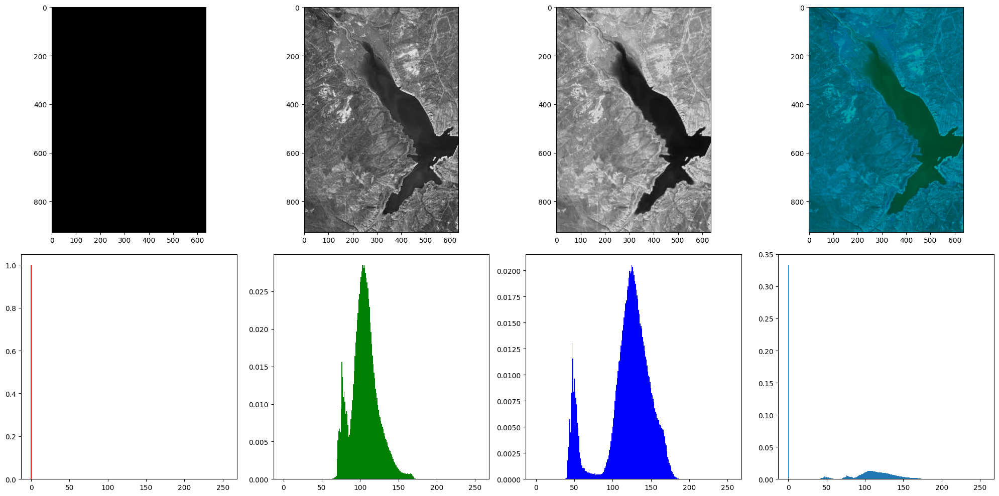

[[ 0. 33.]
 [ 0. 33.]
 [ 0. 33.]
 ...
 [ 0. 33.]
 [ 0. 33.]
 [ 0. 33.]]


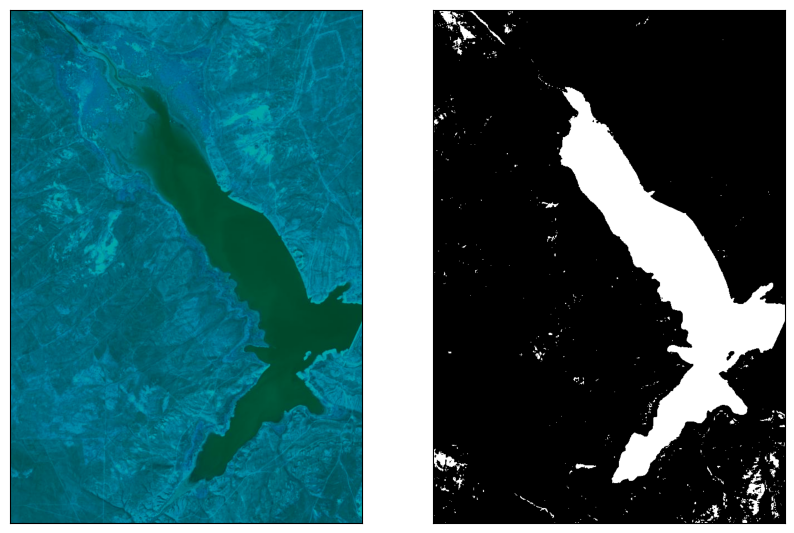

              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99    510901
         1.0       0.90      0.99      0.94     78671

    accuracy                           0.98    589572
   macro avg       0.95      0.98      0.97    589572
weighted avg       0.98      0.98      0.98    589572



In [95]:
# 10. Select Red and Green channels,  apply clustring then provide classification report.
image_gr = cv.merge([black, g, r])

display_hists(image_gr)

im2_seg = applyKmeans(image_gr)

displayImages(image_gr, im2_seg)

getCalcs(im2_seg, gt2)

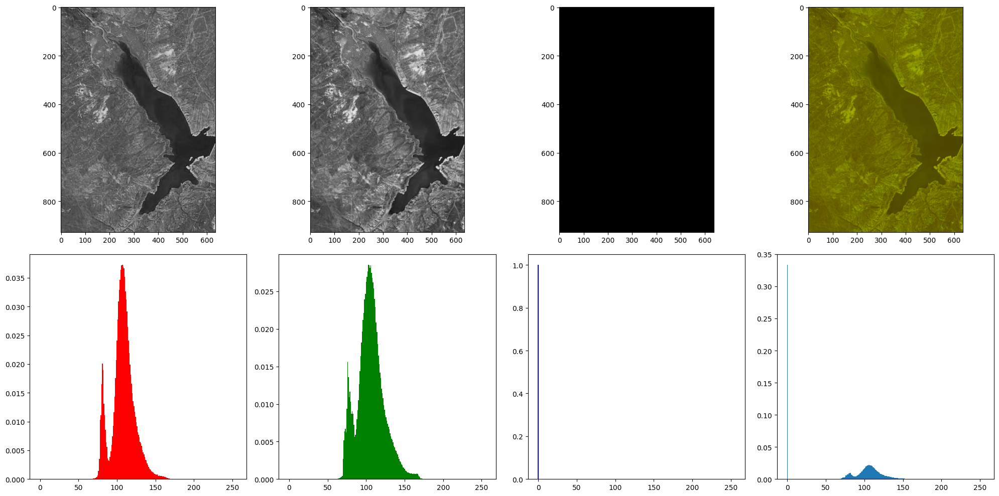

[[ 0. 33.]
 [ 0. 33.]
 [ 0. 33.]
 ...
 [ 0. 33.]
 [ 0. 33.]
 [ 0. 33.]]


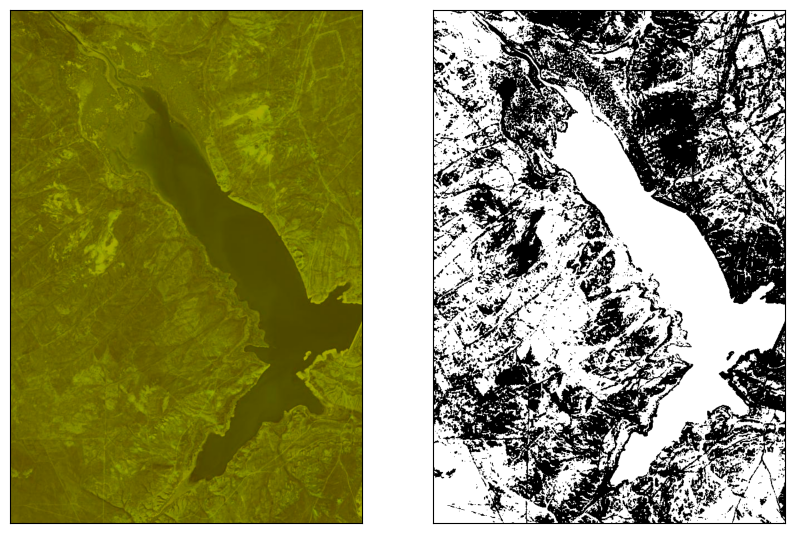

              precision    recall  f1-score   support

         0.0       1.00      0.48      0.65    510901
         1.0       0.23      1.00      0.37     78671

    accuracy                           0.55    589572
   macro avg       0.61      0.74      0.51    589572
weighted avg       0.90      0.55      0.61    589572



In [96]:
# 11. Select Blue and Green channels, apply clustring then provide classification report.
image_bg = cv.merge([b, g, black])

display_hists(image_bg)

im2_seg = applyKmeans(image_bg)

displayImages(image_bg, im2_seg)

getCalcs(im2_seg, gt2)

## Analysis 1
* Discuss the effect of channle selection on the performance of clustering
* Provide your text here:

## Impact of center initialization

In [97]:
# Use im2 (all channels) to condcut this experiment
# 13. Initilize randomly the centers, perform clustering then provide classification report
# Display the clustring image output

### Analysis 2
* Discuss the results compared to the method of center initialization mentioned above (uisng histogram modes).
* Provide your text here: